Большинство туториалов по парсингу становятся неактуальными через несколько месяцев, так как код сайта меняется и парсер нужно переписывать. Специально для этой публикации на основе датасета Google trends сгенерирована HTML-страница со всеми данными из датасета. Мы разберемся как создать HTML-страницу, напишем парсер, соберем всю информацию со странички в датафрейм и проверим, совпадает ли он с оригинальным датафреймом. После этого займемся визуализацией данных с помощью библиотек `pandas`, `mathplotlib`, `plotly`, `seaborn`, `bokeh` и `altair`.

## 1. Генерация HTML-страницы

Для генерации html-страницы воспользуемся библиотекой `yattag`.
Установим библиотеку `pandas` и `yattag`:

In [ ]:
!pip install pandas
!pip install yattag

### 1.1. Создаем HTML-страницу

Разберемся как библиотека `yattag` генерирует HTML-код. Если инструкции `with` записываются последовательно, то теги вкладываются друг в друга:

In [1]:
from yattag import Doc

doc, tag, text = Doc().tagtext()

with tag('h1'):
    text('Заголовок первого уровня')
    with tag('h2'):
        text('Заголовок второго уровня')

print(doc.getvalue())

<h1>Заголовок первого уровня<h2>Заголовок второго уровня</h2></h1>


Если инструкции `with` записываются параллельно/на одном уровне, то теги следуют друг за другом:

In [2]:
doc, tag, text = Doc().tagtext()

with tag('h1'):
    text('Заголовок первого уровня')
with tag('h2'):
    text('Заголовок второго уровня')

print(doc.getvalue())

<h1>Заголовок первого уровня</h1><h2>Заголовок второго уровня</h2>


**Здесь**: 

`tag()` – создает тег.  
`text()` – создает текстовую запись.  
`h1` и `h2` – теги заголовков первого и второго уровня соответственно.  
`doc.getvalue()` – выдает результат.

### 1.2. Структура HTML-страницы

![img1.png](https://github.com/tttdddnet/Python-Data-Journalism/blob/main/part2/img/img1.png?raw=true)

Откроем датафрейм, чтобы узнать названия столбцов, которые станут полями нашей странички:

In [3]:
import pandas as pd
df = pd.read_csv('https://raw.githubusercontent.com/tttdddnet/Python-Data-Journalism/main/part1/trends.csv')
df.head(1)

,location,year,category,rank,query
0,Global,2001,Consumer Brands,1,Nokia


Нам нужно создать пять полей: `location`, `year`, `category`, `rank` и `query`. Стили возьмем из CSS-фреймворка Bootstrap:

In [ ]:
<!DOCTYPE html>
<html>

<head>
    <link href="https://cdn.jsdelivr.net/npm/bootstrap@5.0.0-beta3/dist/css/bootstrap.min.css" rel="stylesheet" integrity="sha384-eOJMYsd53ii+scO/bJGFsiCZc+5NDVN2yr8+0RDqr0Ql0h+rP48ckxlpbzKgwra6" crossorigin="anonymous" />
</head>

<body>
    <div class="container py-5" id="featured-3">
        <h2 class="pb-2 border-bottom">Google trends</h2>
        <div class="row g-5 py-5">
        
            <!-- Начало блока. Мы напишем цикл и повторим это блок со всеми значениями из датафрейма. -->
            
            <div class="feature col-md-4">
                <h1 class="display-6">#1 in Global</h1>
                <ul class="list-group">
                    <li class="list-group-item list-group-item-info">Query: Nokia</li>
                    <li class="list-group-item list-group-item-primary">Category: Consumer Brands</li>
                </ul>
                <span class="badge bg-primary rounded-pill">2001</span>
            </div>
            
            <!-- Конец блока. -->

        </div>
    </div>
</body>

</html>

**Здесь**:

`<!DOCTYPE html>` – указание типа текущего документа, то есть HTML.  
`<html>` – контейнер для всего содержимого веб-страницы.  
`<head>` – контейнер для заголовка и технической информации. В него мы впишем ссылку на Bootstrap.  
`<link href= />` – ссылка на CSS-файл.  
`<body>` – содержит контент веб-страницы. В нашем случае – значения из датафрейма.  
`<h2>` – заголовок второго уровня со значением поля `rank` и `location`.  

`<li>` – два элемента списка: значения столбцов `query` и `category`.  

`<span>` – строковый контейнер со значением из столбца `year`.  

### 1.3. Генерация HTML-страницы

![img2.png](https://github.com/tttdddnet/Python-Data-Journalism/blob/main/part2/img/img2.png?raw=true)

Сгенерируем  из датафрейма HTML-страничку:

In [4]:
from yattag import Doc

df = pd.read_csv('https://raw.githubusercontent.com/tttdddnet/Python-Data-Journalism/main/part1/trends.csv')

doc, tag, text, line = Doc().ttl()

#объявление типа документа
doc.asis('<!DOCTYPE html>')

#создание тега html
with tag('html'): 
    
    #создание тега head
    with tag('head'):
        doc.stag("link href='https://cdn.jsdelivr.net/npm/bootstrap@5.0.0-beta3/dist/css/bootstrap.min.css' rel='stylesheet' integrity='sha384-eOJMYsd53ii+scO/bJGFsiCZc+5NDVN2yr8+0RDqr0Ql0h+rP48ckxlpbzKgwra6' crossorigin='anonymous'")
    
    #создание тега body    
    with tag('body'):
        
        #создание блочного элемента
        with tag('div', klass = 'container py-5', id = 'featured-3'):
                line('h2', 'Google trends', klass = 'pb-2 border-bottom')
                
                #создание блочного элемента
                with tag('div', klass = 'row g-5 py-5'):
                    
                    #создание блоков с данными из столбцов датафрейма 
                    for i in range(len(df.index)):                     
                        with tag('div', klass = 'feature col-md-4'):
                            
                            #создание тега со значениями rank и location
                            elements = ['#', df['rank'][i].astype(str), ' in ', df['location'][i]]
                            rank_and_location_line = ''.join(elements)
                            line('h1', rank_and_location_line, klass = 'display-6')
                            
                            #создание маркированного списка со значениями query и category
                            with tag('ul', klass = 'list-group'):
                                query_line = 'Query: ' + df['query'][i]
                                category_line = 'Category: ' + df['category'][i]
                                line('li', query_line, klass='list-group-item list-group-item-info')
                                line('li', category_line, klass = 'list-group-item list-group-item-primary')
                            
                            #создания тега со значением year
                            with tag('span', klass = 'badge bg-primary rounded-pill'):
                                text(df['year'][i].astype(str))
                                
                                
#создание файла googletrends.html, запись в него HTML-кода, сохранение изменений                 
with open('googletrends.html', 'w', encoding='utf-8') as file:
    file.write(doc.getvalue())

Сгенерированная [страничка](https://raw.githubusercontent.com/tttdddnet/Python-Data-Journalism/main/part2/html/googletrends.html) доступна на Гитхабе.

**Здесь**:  

`doc.asis()` – метод `asis()` не экранирует символы, без него мы получим `<<!DOCTYPE html> />`. 

`tag(html)` – создает тег `<html></html>`.  

`doc.stag("link href=...")` – создает самозакрывающийся тег `<link href= ... />`.  

`line('h2')` – создает тег `<h2></h2>` после иснтрукции `with tag():`.

`klass = ''` – класс CSS. Классы берутся из Bootstrap.  

`for i in range(len(df.index))` – цикл, создающий HTML-блоки с содержимым из датафрейма.  

`rank_and_location_line`, `query_line`, `category_line` – создают строчки со значениями из столбцов датафрейма `rank`, `location`, `query`, `category`.  

`df['rank'][i].astype(str)` – тип переменной меняется с числового на строчный для конкатенации с другими строчками.  

`with open("googletrends.html", "w", encoding='utf-8')` – создает файл `googletrends.html` и записывает в него в режиме `w` HTML-код. Кодировка `utf-8`, чтобы избежать ошибки `UnicodeEncodeError`.  

## 2. Пишем парсер

### 2.1. Библиотека Beautiful Soup

![img3.png](https://github.com/tttdddnet/Python-Data-Journalism/blob/main/part2/img/img3.png?raw=true)

Для получения HTML-кода воспользуемся библиотекой `requests`, а для парсинга разметки HTML библиотекой `beautifulsoup4`.

Установим библиотеки:

In [ ]:
!pip install beautifulsoup4
!pip install requests

Напишем парсер:

In [5]:
from bs4 import BeautifulSoup
import requests

r = requests.get('https://raw.githubusercontent.com/tttdddnet/Python-Data-Journalism/main/part2/html/googletrends.html')
soup = BeautifulSoup(r.text, 'html.parser')

year_parsed = soup.find_all('span', {'class': 'rounded-pill'})
category_parsed = soup.find_all('li', {'class': 'list-group-item-primary'})
rank_and_location_parsed = soup.find_all('h1')
query_parsed = soup.find_all('li', {'class': 'list-group-item-info'})

locations = []
years = []
categories = []
ranks = []
queries = []

for a, b, c, d in zip(rank_and_location_parsed, year_parsed, category_parsed, query_parsed):
    locations.append(a.getText()[6:])
    years.append(b.getText())
    categories.append(c.getText()[10:])
    ranks.append(a.getText()[1])
    queries.append(d.getText()[7:])

**Здесь**:  

`r = requests.get()` – отправляет GET-запрос сгенерированной в предыдущей главе веб-странице и извлекает из нее данные.  
`soup = BeautifulSoup(r.text, 'html.parser')` – создает объект `BeautifulSoup` из полученных данных. С помощью этого объекта можно найти разные элементы страницы. Например, содержимое тега `<head>` через `soup.head` и так далее.  
`soup.find_all('span', {'class': 'rounded-pill'}`) – метод `find_all` ищет содержимое в указанном теге с заданным классом и возвращает все совпадения в виде списка. В нашем случае – содержимое в теге `span`, который имеет класс `rounded-pill`.  
    
`locations`, `years`, `categories`, `ranks`, `queries` – списки, в которые добавляются соответствующее содержимое тегов.



![img4.png](https://github.com/tttdddnet/Python-Data-Journalism/blob/main/part2/img/img4.png?raw=true)

Значение `rank` и `location` находятся на одной строчке. Мы точно знаем, что `rank` – всегда второй символ, а `location` – все символы, начиная с седьмого. Воспользуемся индексами и срезами, чтобы получить нужные значения из строчки: `[1]` для `rank` и `[6:]` для `location`. Значения `query` и `category` также получаем через срезы, а `year` берем как есть.  

Создадим пустой датафрейм со столбцами `locations`, `years`, `categories`, `ranks`, `queries`:

In [6]:
df = pd.DataFrame(columns=['location','year','category','rank','query'])
df

,location,year,category,rank,query


и заполним столбцы значениями из соответствующих списков:

In [7]:
df = pd.DataFrame({'location': locations,'year': years,'category': categories,'rank': ranks,'query': queries})
df

,location,year,category,rank,query
0,Global,2001,Consumer Brands,1,Nokia
1,Global,2001,Consumer Brands,2,Sony
2,Global,2001,Consumer Brands,3,BMW
3,Global,2001,Consumer Brands,4,Palm
4,Global,2001,Consumer Brands,5,Adobe
...,...,...,...,...,...
26950,Vietnam,2020,Là Gì?,1,Virus Corona là gì
26951,Vietnam,2020,Là Gì?,2,Miễn thị thực là gì
26952,Vietnam,2020,Là Gì?,3,Đầu cắt moi là gì
26953,Vietnam,2020,Là Gì?,4,Bệnh bạch hầu là gì


Узнаем количество строк и столбцов:

In [8]:
df.shape

(26955, 5)

и типы данных в столбцах:

In [9]:
df.dtypes

location    object
year        object
category    object
rank        object
query       object
dtype: object

Значения в столбцах `year` и `rank` имеют тип `object`, а должны иметь тип целое число `int`. Изменим их тип на `int64`, как в оригинальном датасете:

In [10]:
df['year'] = df['year'].astype('int64')
df['rank'] = df['rank'].astype('int64')
df.dtypes

location    object
year         int64
category    object
rank         int64
query       object
dtype: object

Сравним полученный нами датасет с оригинальным методом `equals()`:

In [11]:
df_original = pd.read_csv('https://raw.githubusercontent.com/tttdddnet/Python-Data-Journalism/main/part2/data/trends_original.csv')
df.equals(df_original)

True

Мы получили `True` – датасеты совпадают. Переходим к визуализации данных.

## 3. Визуализация данных

### 3.1. Библиотека Pandas

![img5.png](https://github.com/tttdddnet/Python-Data-Journalism/blob/main/part2/img/img5.png?raw=true)

[Сайт](https://pandas.pydata.org/) | [Галерея графиков](https://pandas.pydata.org/pandas-docs/stable/user_guide/visualization.html) 

В библиотеке `pandas` есть встроенные методы визуализации данных. Они не такие продвинутые как в `matplotlib` и других библиотеках, но тоже могут пригодиться.

In [12]:
df = pd.read_csv('https://raw.githubusercontent.com/tttdddnet/Python-Data-Journalism/main/part2/data/trends_original.csv')

def highlight_max(v):
    is_max = v == v.max()
    return ['background-color: yellow' if x else '' for x in is_max]

def highlight_min(v):
    is_max = v == v.min()
    return ['background-color: green' if x else '' for x in is_max]

Выделим цветом максимальные значения в столбце `rank`:

In [13]:
df[:10].style.apply(highlight_max, subset=['rank'])

,location,year,category,rank,query
0,Global,2001,Consumer Brands,1,Nokia
1,Global,2001,Consumer Brands,2,Sony
2,Global,2001,Consumer Brands,3,BMW
3,Global,2001,Consumer Brands,4,Palm
4,Global,2001,Consumer Brands,5,Adobe
5,Global,2001,Men,1,Nostradamus
6,Global,2001,Men,2,Osama bin Laden
7,Global,2001,Men,3,Eminem
8,Global,2001,Men,4,Michael Jackson
9,Global,2001,Men,5,Howard Stern


и минимальные значения:

In [14]:
df[:10].style.apply(highlight_min, subset=['rank'])

,location,year,category,rank,query
0,Global,2001,Consumer Brands,1,Nokia
1,Global,2001,Consumer Brands,2,Sony
2,Global,2001,Consumer Brands,3,BMW
3,Global,2001,Consumer Brands,4,Palm
4,Global,2001,Consumer Brands,5,Adobe
5,Global,2001,Men,1,Nostradamus
6,Global,2001,Men,2,Osama bin Laden
7,Global,2001,Men,3,Eminem
8,Global,2001,Men,4,Michael Jackson
9,Global,2001,Men,5,Howard Stern


**Здесь**:  

`highlight_max`, `highlight_min` – функции, принимающие значение из столбца `rank`. Если значение максимальное, то ячейка выделяется желтым цветом. В противном случае цвет не меняется.  
`df.style.apply()` – изменяет визуальное оформление значений в столбце/строке/всей таблице.  

In [15]:
df[:10].style.bar(subset=['rank'], color='#d65f5f')

,location,year,category,rank,query
0,Global,2001,Consumer Brands,1,Nokia
1,Global,2001,Consumer Brands,2,Sony
2,Global,2001,Consumer Brands,3,BMW
3,Global,2001,Consumer Brands,4,Palm
4,Global,2001,Consumer Brands,5,Adobe
5,Global,2001,Men,1,Nostradamus
6,Global,2001,Men,2,Osama bin Laden
7,Global,2001,Men,3,Eminem
8,Global,2001,Men,4,Michael Jackson
9,Global,2001,Men,5,Howard Stern


**Здесь**:  

`df.style.bar()` – создает столбиковую диаграмму.  

### 3.2. Библиотека Matplotlib

[Сайт](https://matplotlib.org/) | [Галерея графиков](https://matplotlib.org/stable/gallery/index.html)

Библиотеке `matplotlib` больше десяти лет и она до сих пор развивается. Построим с ее помощью столбиковую диаграмму, на которой отобразим ТОП-10 песен, продержавшихся в чарте The Billboard Hot 100 максимальное количество недель. Оригинал датасета доступен [здесь](https://www.kaggle.com/dhruvildave/billboard-the-hot-100-songs).

Установим `matplotlib`:

In [ ]:
!pip install matplotlib

In [16]:
df = pd.read_csv('https://raw.githubusercontent.com/tttdddnet/Python-Data-Journalism/main/part2/data/charts.csv')
df

,date,rank,song,artist,last-week,peak-rank,weeks-on-board
0,1958-08-04,1,Poor Little Fool,Ricky Nelson,NaN,1,1
1,1958-08-04,2,Patricia,Perez Prado And His Orchestra,NaN,2,1
2,1958-08-04,3,Splish Splash,Bobby Darin,NaN,3,1
3,1958-08-04,4,Hard Headed Woman,Elvis Presley With The Jordanaires,NaN,4,1
4,1958-08-04,5,When,Kalin Twins,NaN,5,1
...,...,...,...,...,...,...,...
326682,2021-03-13,96,Nobody,Dylan Scott,NaN,96,1
326683,2021-03-13,97,Cover Me Up,Morgan Wallen,95.0,52,9
326684,2021-03-13,98,Like I Want You,Giveon,100.0,95,3
326685,2021-03-13,99,Gone,Dierks Bentley,NaN,99,1


Создадим датафрейм `df_wob` и запишем в него ТОП-10 песен с максимальным значением `weeks-on-board` (количество недель в чарте):

In [17]:
df_wob = df.nlargest(80, ['weeks-on-board']).drop_duplicates(subset=['song']).copy()
df_wob

,date,rank,song,artist,last-week,peak-rank,weeks-on-board
290935,2014-05-10,49,Radioactive,Imagine Dragons,48.0,3,87
290231,2014-03-22,45,Sail,AWOLNATION,41.0,17,79
267034,2009-10-10,48,I'm Yours,Jason Mraz,49.0,6,76
209631,1998-10-10,45,How Do I Live,LeAnn Rimes,48.0,2,69
281535,2012-07-21,49,Party Rock Anthem,LMFAO Featuring Lauren Bennett & GoonRock,50.0,1,68
293236,2014-10-18,50,Counting Stars,OneRepublic,47.0,2,68
206333,1998-02-21,47,Foolish Games/You Were Meant For Me,Jewel,42.0,2,65
280135,2012-04-14,49,Rolling In The Deep,Adele,43.0,1,65
326589,2021-03-13,3,Blinding Lights,The Weeknd,5.0,1,65
257333,2007-12-01,47,Before He Cheats,Carrie Underwood,43.0,8,64


**Здесь**:  

`nlargest(80, ['weeks-on-board'])` – возвращает 80 максимальных значений в столбце `weeks-on-board`.  

`drop_duplicates(subset=['song'])` – убирает все дубликаты в столбце `song`.  


<BarContainer object of 10 artists>

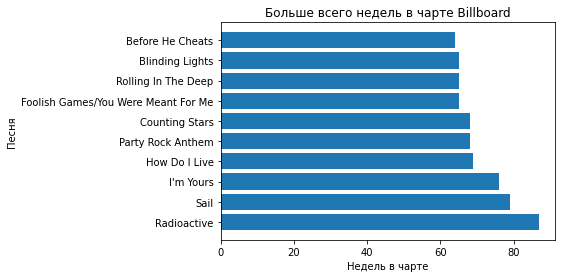

In [19]:
import matplotlib.pyplot as plt

song = list(df_wob['song'])
weeks_on_board = list(df_wob['weeks-on-board'])

fig, ax = plt.subplots()
ax.set(xlabel='Недель в чарте', ylabel='Песня',
       title='Больше всего недель в чарте Billboard')


ax.barh(song, weeks_on_board)

**Здесь**: 

`list(df_wob['song'])` – создает список из элементов столбца `song`.  

`list(df_wob['weeks-on-board'])` – создает список из элементов столбца `weeks-on-board`.  

`fig` – создает контейнер для визуальных объектов.  
`ax` – объявляет визуальные объекты.  
`xlabel`, `ylabel`, `title` – метки на осях `x`, `y` и название диаграммы соответственно.  
`barh(song, weeks_on_board)` – создает диаграмму со значениями из столбцов `song` и `weeks_on_board`.  


### 3.3. Библиотека Plotly

[Сайт](https://plotly.com/) | [Галерея графиков](https://plotly.com/python/)

Установим библиотеку `Plotly`:

In [ ]:
!pip install plotly

На основе датасета «Отчет по уровню счастья в мире» ([оригинал](https://www.kaggle.com/unsdsn/world-happiness)) построим график зависимости уровня счастья в разных странах от качества социальной поддержки.

In [20]:
import plotly.express as px

df = pd.read_csv('https://raw.githubusercontent.com/tttdddnet/Python-Data-Journalism/main/part2/data/happiness_2019.csv')

fig = px.scatter(df, x="Social support", y="Score", color="Freedom to make life choices", hover_name="Country or region", size="Social support")
fig.show()

**Здесь**:

`px` – модуль `plotly.express` является частью библиотеки `plotly`. Он ускоряет создания графиков за счет своего лаконичного синтаксиса.  
`scatter()` – инициирует создание пузырьковой диаграммы.  
`x=''`, `y=''` – значения по оси `x`, и `y` соответственно.  
`color` – добавляет градацию по цвету в зависимости от значения `Freedom to make life choices`.  
 
`hover_name` – добавляет всплывающее окно при наведении на метку.  
`size` – задает размер круга в зависимости от значения `Social support`.  

Размер круга определяется величиной социальной поддержки. Цветом выделен уровень свободы в принятии решений: желтый цвет – максимум свободы. В лидерах Финляндия, Дания, Норвегия и Исландия. 

### 3.4. Библиотека Seaborn

[Сайт](https://seaborn.pydata.org/) | [Галерея графиков](https://seaborn.pydata.org/examples/index.html)

`Seaborn` – обертка над библиотекой `matplotlib`. Она представляет  высокоуровневый интерфейс для рисования красивых и информативных графиков.  
Установим библиотеку `seaborn`:

In [ ]:
!pip install seaborn

Построим тепловую карту цен на газ в зависимости от года. На тепловой карте значения отображаются с помощью цвета, но мы так же подключим численное отображение:

In [22]:
df = pd.read_csv('https://raw.githubusercontent.com/tttdddnet/Python-Data-Journalism/main/part2/data/gas_monthly.csv')
df

,Month,Price
0,1997-01,3.45
1,1997-02,2.15
2,1997-03,1.89
3,1997-04,2.03
4,1997-05,2.25
...,...,...
279,2020-04,1.74
280,2020-05,1.75
281,2020-06,1.63
282,2020-07,1.77


Посмотрим какие у нас типы в столбцах:

In [23]:
df.dtypes

Month     object
Price    float64
dtype: object

Столбец `Month` имеет тип `object`. Чтобы получить значения года и месяца преобразуем его тип в `datetime`:

In [24]:
df['Month'] = pd.to_datetime(df['Month'])
df.dtypes

Month    datetime64[ns]
Price           float64
dtype: object

Создадим из столбца `Month` отдельные столбцы с годом `Год` и месяцем `Месяц`:

In [25]:
df['Год'] = df['Month'].dt.year
df['Месяц'] = df['Month'].dt.month
df

,Month,Price,Год,Месяц
0,1997-01-01,3.45,1997,1
1,1997-02-01,2.15,1997,2
2,1997-03-01,1.89,1997,3
3,1997-04-01,2.03,1997,4
4,1997-05-01,2.25,1997,5
...,...,...,...,...
279,2020-04-01,1.74,2020,4
280,2020-05-01,1.75,2020,5
281,2020-06-01,1.63,2020,6
282,2020-07-01,1.77,2020,7


Нарисуем тепловую карту:

<AxesSubplot:xlabel='Год', ylabel='Месяц'>

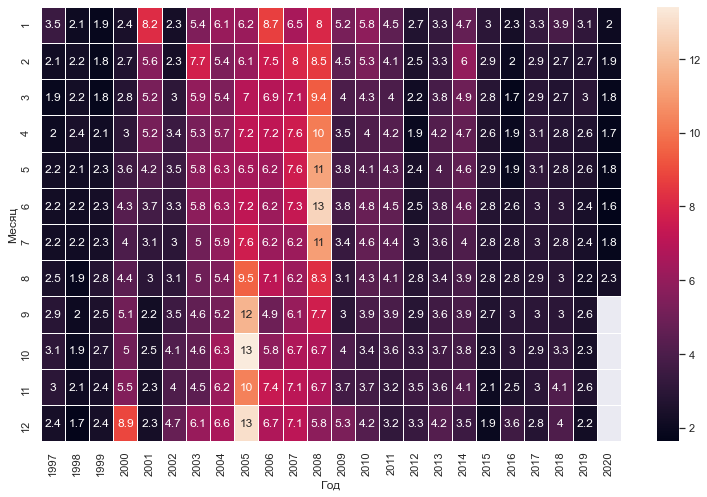

In [26]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_theme()

Gas_price = df.pivot("Месяц", "Год", "Price")

f = plt.subplots(figsize=(13, 8))
sns.heatmap(Gas_price, annot=True, linewidths=.5)

**Здесь**:

`set_theme()` – устанавливает стиль диаграмы.  
`df.pivot()` – создает сводную таблицу.  
`figsize=(x, y)` – задает размеры ячейки: `x` – ширина, `y` – высота.  
`heatmap()` – создает тепловую карту.  
`annot=True` – добавляет численные значения к каждой ячейке.  
`linewidths` – задает толщину разделительных линий.  

### 3.5. Библиотека Bokeh

[Сайт](https://docs.bokeh.org/en/latest/) | [Галерея графиков](https://docs.bokeh.org/en/latest/docs/gallery.html)

Библиотека Bokeh помогает создавать графику, начиная с простых графиков и заканчивая сложными инструментальными панелями с большими наборами данных. 

Установим библиотеку Bokeh:

In [ ]:
!pip install bokeh

Построим диаграммы по гендерному распределению главных ролей в фильмах и сериалах Netflix за последние пять лет. За основу возьмем датасет [«Оригинальный датасет Нетфликса»](https://www.kaggle.com/aditya6899/a-netflix-original-content-dataset).

In [27]:
df = pd.read_csv('https://raw.githubusercontent.com/tttdddnet/Python-Data-Journalism/main/part2/data/netflix_original_content_dataset.csv')
df

,Title,Type,Year Released,Seasons,Main Actor,Genre,International,Animated,RT Critic Score,RT Audience Score,IMDb Rating,Rating,Viewership (Millions)
0,#realityhigh,Film,2017,NaN,Female,Comedy,no,no,40.0,53,5.2,TV-14,78
1,13TH,Film,2016,NaN,Both,Crime,no,no,97.0,91,8.2,TV-MA,10
2,1922,Film,2017,NaN,Male,Thriller,no,no,88.0,57,6.3,TV-MA,72
3,1983,TV,2018,1.0,Male,"Crime, Drama",yes,no,100.0,81,7.1,TV-MA,17
4,22-Jul,Film,2018,NaN,Both,"Drama, Thriller",no,no,79.0,69,6.7,R,16
...,...,...,...,...,...,...,...,...,...,...,...,...,...
131,The Highwaymen,Film,2019,NaN,Male,Drama,no,no,56.0,77,7.0,R,95
132,The Umbrella Academy,TV,2019,1.0,Both,"Action, Mystery, Fantasy",no,no,76.0,85,8.1,TV-14,38
133,Elite,TV,2018,1.0,Both,Crime,yes,no,100.0,83,7.6,TV-MA,9
134,Baby,TV,2018,1.0,Female,"Drama, Teen",yes,no,80.0,78,6.8,TV-MA,30


Нарисуем график:

In [28]:
from bokeh.io import show, output_notebook, reset_output
from bokeh.plotting import figure

#reset_output()
output_notebook()

sex = ['Мужчина', 'Женщина', 'Вместе']
years = ["2015", "2016", "2017", "2018", "2019"]
colors = ["#368223", "#718dbf", "#e84d60", "#fcba03", "#3fb5af"]

data = {'sex' : sex,      
        '2015'   : [df.loc[(df['Year Released'] == 2015) & (df['Main Actor'] == 'Male')]['Main Actor'].count(), 
                    df.loc[(df['Year Released'] == 2015) & (df['Main Actor'] == 'Female')]['Main Actor'].count(), 
                    df.loc[(df['Year Released'] == 2015) & (df['Main Actor'] == 'Both')]['Main Actor'].count()],
        
        '2016'   : [df.loc[(df['Year Released'] == 2016) & (df['Main Actor'] == 'Male')]['Main Actor'].count(), 
                    df.loc[(df['Year Released'] == 2016) & (df['Main Actor'] == 'Female')]['Main Actor'].count(), 
                    df.loc[(df['Year Released'] == 2016) & (df['Main Actor'] == 'Both')]['Main Actor'].count()],

        '2017'   : [df.loc[(df['Year Released'] == 2017) & (df['Main Actor'] == 'Male')]['Main Actor'].count(), 
                    df.loc[(df['Year Released'] == 2017) & (df['Main Actor'] == 'Female')]['Main Actor'].count(), 
                    df.loc[(df['Year Released'] == 2017) & (df['Main Actor'] == 'Both')]['Main Actor'].count()],
        
        '2018'   : [df.loc[(df['Year Released'] == 2018) & (df['Main Actor'] == 'Male')]['Main Actor'].count(), 
                    df.loc[(df['Year Released'] == 2018) & (df['Main Actor'] == 'Female')]['Main Actor'].count(), 
                    df.loc[(df['Year Released'] == 2018) & (df['Main Actor'] == 'Both')]['Main Actor'].count()],
        
        '2019'   : [df.loc[(df['Year Released'] == 2019) & (df['Main Actor'] == 'Male')]['Main Actor'].count(), 
                    df.loc[(df['Year Released'] == 2019) & (df['Main Actor'] == 'Female')]['Main Actor'].count(), 
                    df.loc[(df['Year Released'] == 2019) & (df['Main Actor'] == 'Both')]['Main Actor'].count()]}

p = figure(x_range=sex, plot_height=250, title="Пол протагониста",
           toolbar_location=None, tools="hover", tooltips="$name год, @sex: @$name")

p.vbar_stack(years, x='sex', width=0.9, color=colors, source=data,
             legend_label=years)

p.y_range.start = 0
p.x_range.range_padding = 0.1
p.legend.location = "right"
p.legend.orientation = "vertical"
show(p)

Loading BokehJS ...

**Здесь**:  

`sex` – пол протагониста: мужской, женский, вместе (главные герои мужчина и женщина).  
`data` – словарь со значением пола, и количеством протагонистов у каждого пола с 2015 по 2019 годы .  
`df.loc[(df['Year Released'] == 2017) & (df['Main Actor'] == 'Male')]['Main Actor'].count()` – фильтрация датасета по 2017 году и мужскому полу; `count()` – подсчет количества непустых строчек (без `NaN`), то есть сколько раз мужчины были протагонистами.  
`x_range` – определяет значение метки деления.  
`toolbar_location=None` – скрывает панель инструментов.  
`tools="hover"` – включает подсказку при наведении на диаграмму.  
`tooltips=""` – данные подсказки.  
`vbar_stack()` – генерирует снизу наверх несколько уровней/контейнеров в диаграмме.  
`y_range.start` – определяет с какого уровня по оси y строить диаграмму.  
`x_range.range_padding` – задает начальное смещение диаграмм вправо по оси `x`.  

`legend.locationс` и `legend.orientation` – определяют место и ориентацию описания диаграмм соответственно.  

### 3.6. Библиотека Altair

[Сайт](https://altair-viz.github.io/) | [Галерея графиков](https://altair-viz.github.io/gallery/index.html)

`Altair` – это библиотека визуализации для Python, основанная на инструментах визуализации `Vega` и `Vega-Lite`.

Установим `Altair`:

In [ ]:
!pip install altair

Построим графики изменения цен криптовалют за последние семь лет. Импортируем датасеты ([оригиналы](https://www.kaggle.com/sudalairajkumar/cryptocurrencypricehistory)):

In [29]:
df1 = pd.read_csv('https://raw.githubusercontent.com/tttdddnet/Python-Data-Journalism/main/part2/data/coin_Aave.csv')
df2 = pd.read_csv('https://raw.githubusercontent.com/tttdddnet/Python-Data-Journalism/main/part2/data/coin_BinanceCoin.csv')
df3 = pd.read_csv('https://raw.githubusercontent.com/tttdddnet/Python-Data-Journalism/main/part2/data/coin_Bitcoin.csv')
df4 = pd.read_csv('https://raw.githubusercontent.com/tttdddnet/Python-Data-Journalism/main/part2/data/coin_Cardano.csv')
df5 = pd.read_csv('https://raw.githubusercontent.com/tttdddnet/Python-Data-Journalism/main/part2/data/coin_ChainLink.csv')
df6 = pd.read_csv('https://raw.githubusercontent.com/tttdddnet/Python-Data-Journalism/main/part2/data/coin_Cosmos.csv')
df7 = pd.read_csv('https://raw.githubusercontent.com/tttdddnet/Python-Data-Journalism/main/part2/data/coin_CryptocomCoin.csv')
df8 = pd.read_csv('https://raw.githubusercontent.com/tttdddnet/Python-Data-Journalism/main/part2/data/coin_Dogecoin.csv')
df9 = pd.read_csv('https://raw.githubusercontent.com/tttdddnet/Python-Data-Journalism/main/part2/data/coin_EOS.csv')
df10 = pd.read_csv('https://raw.githubusercontent.com/tttdddnet/Python-Data-Journalism/main/part2/data/coin_Ethereum.csv')
df11 = pd.read_csv('https://raw.githubusercontent.com/tttdddnet/Python-Data-Journalism/main/part2/data/coin_Iota.csv')
df12 = pd.read_csv('https://raw.githubusercontent.com/tttdddnet/Python-Data-Journalism/main/part2/data/coin_Litecoin.csv')
df13 = pd.read_csv('https://raw.githubusercontent.com/tttdddnet/Python-Data-Journalism/main/part2/data/coin_Monero.csv')
df14 = pd.read_csv('https://raw.githubusercontent.com/tttdddnet/Python-Data-Journalism/main/part2/data/coin_NEM.csv')
df15 = pd.read_csv('https://raw.githubusercontent.com/tttdddnet/Python-Data-Journalism/main/part2/data/coin_Polkadot.csv')
df16 = pd.read_csv('https://raw.githubusercontent.com/tttdddnet/Python-Data-Journalism/main/part2/data/coin_Solana.csv')
df17 = pd.read_csv('https://raw.githubusercontent.com/tttdddnet/Python-Data-Journalism/main/part2/data/coin_Stellar.csv')
df18 = pd.read_csv('https://raw.githubusercontent.com/tttdddnet/Python-Data-Journalism/main/part2/data/coin_Tether.csv')
df19 = pd.read_csv('https://raw.githubusercontent.com/tttdddnet/Python-Data-Journalism/main/part2/data/coin_Tron.csv')
df20 = pd.read_csv('https://raw.githubusercontent.com/tttdddnet/Python-Data-Journalism/main/part2/data/coin_USDCoin.csv')
df21 = pd.read_csv('https://raw.githubusercontent.com/tttdddnet/Python-Data-Journalism/main/part2/data/coin_Uniswap.csv')
df22 = pd.read_csv('https://raw.githubusercontent.com/tttdddnet/Python-Data-Journalism/main/part2/data/coin_WrappedBitcoin.csv')
df23 = pd.read_csv('https://raw.githubusercontent.com/tttdddnet/Python-Data-Journalism/main/part2/data/coin_XRP.csv')

Объединим датафреймы:

In [30]:
df1 = pd.DataFrame()
df1 = pd.concat([df1, df2, df3, df4, df5, df6, df7, df8, df9, df10, df11, df12, 
                df13, df14, df15, df16, df17, df18, df19, df20, df21, df22, df23], axis=0)

**Здесь**:

`concat([df1, df2, ... ], axis=0)` – метод `concat()` добавляет к датафрейму `df1` строчки из других датафреймов.


#### Ошибка MaxRowsError
`MaxRowsError: The number of rows in your dataset is greater than the maximum allowed (5000). For information on how to plot larger datasets in Altair, see the documentation`.

У нас получилось 33969 строк. По умолчанию `altair` визуализирует датасеты максимум с 5000 строк. Чтобы обойти это ограничение добавим следующую запись в код: `alt.data_transformers.disable_max_rows()`.



Нарисуем графики:

In [31]:
import altair as alt

alt.data_transformers.disable_max_rows()

alt.Chart(df1).mark_line().encode(
    x='Date',
    y='Marketcap',
    color='Name',
).interactive()

alt.Chart(...)

**Здесь**:

`Chart(df1).mark_line()` – создает график из линий на основе датасета `df1`. Если поставить `mark_circle()`, то график строится из кружков. Больше вариантов в [документации](https://altair-viz.github.io/user_guide/marks.html).  

`x='Date'` и `y='Marketcap'` – значения на осях `x` и `y` из столбоцов `Date` и `Markercap` соответственно.  
`interactive()` – добавляет возможность передвигать графики курсором мыши и изменять масштаб колесиком мыши.